 <center> <h1> <b> Pattern Recognition and Machine Learning (EE5610 - EE2802 - AI2000 - AI5000) </b> </h1> </center>

<b> Programming Assignment - 05 : Dynamic Time Warping (DTW)  </b>


We expect you to code the dynamic time warping algorithm from scratch in this programming assignment. The skeleton code is provided for you to understand the algorithm. At the end of the assignment, you need to write an algorithm to perform an isolated digit recognition task using Dynamic Time Warping (DTW) codes. Isolated digit recognition is the task of recognizing the digit from the test speech signal having a single digit in isolation.

<b> Instructions </b>
1. Plagiarism is strictly prohibited.
2. Delayed submissions will be penalized with a scaling factor of 0.5 per day.
3. Please DO NOT use any machine learning libraries unless and otherwise specified.








<h4> <b> Part (a). Dynamic Time Warping(DTW): </b>  In this part you need to try and implement the basic sequence matching algorithm DTW. </h4>
<dt> <h4> Two sequences A and B can be compared using a euclidean distance
<center> $ A = (x_1, x_2, x_3, ..., x_M)$ </center> <br>
<center> $ B = (y_1, y_2, y_3, ..., y_N)$ </center> <br> </h4> </dt>
<dt> <h4> Now the distance is computed as </h4> </dt>
<center> $ D(A,B) = \frac{1}{N} \sum_1^N || x_n - y_n||$</center> </h4> </dt>
<dt> <h4> There are two main issues </h4> </dt>
<dd> <h4> 1. What if the sequences are not aligned in time ?</h4> </dt>
<dd> <h4> 2. What if the sequences have varying lengths ?</h4> </dt>
<dt> <h4> The non-linear alignment path produces a better similarity measure. </h4> </dt>

![picture](https://drive.google.com/uc?export=view&id=1XWTK0XUpDIuf-5nbe7pk6uPx29-22zF0)

<dt> <h4> <b> Algorithm </b> </h4> </dt>
<dt> <h4>  1. Compute distance matrix $D_{M\times N}$ between A and B </h4> </dt>
<dt> <h4>  2. Compute accumulated distance matrix $C_{M\times N}$ between A and B </h4> </dt>
<dd> <h4>  ~ Initialize: C(0,0) = D(0,0) </h4> </dd>
<dd> <h4>  ~ for i=1,2,..M and j=1,2,...N  <dd> <h4>  ~ Update C <dd> <h4> C(i,j) = D(i,j) + min {C(i−1, j−1), C(i, j−1), C(i−1, j)} </h4> </dd> </h4> </dd> <dd> <h4>  ~ Store the best Path <dd> <h4> P(i,j) = arg min {C(i−1, j−1), C(i, j−1), C(i−1, j)} </h4> </dd> </h4> </dd> </h4> </dd>
<dt> <h4>  3. C(M,N) gives the similarity measure </h4> </dt>
<dt> <h4>  4. Backtrack the best alignment path <br> <center> $ q_T^* = (M,N) \\ q_{t-1}^* = P(q_t^*) \qquad t = T,T-1,....1$ </center></h4> </dt>
<dt> <h4> <b> Programming question </b> </h4> </dt>
<dt> <h4>  1. Consider the following two sequences $A = [4,3,7,0,2,6,5]$, and $B = [3,7,1,6,1,5,4,4]$. Write a DTW algorithm to find the optimal similarity/distance between them. </h4> </dt>
<dd> <h4> - Compute the distance matrix between the two sequences </dd> </h4>
<dd> <h4> - Compute the accumulative distance matrix </dd> </h4>
<dd> <h4> - Backtrack from the accumulative distance matrix to get the optimal path and thereby compute the optimal distance </dd> </h4>
<dd> <h4> - Plot the optimal path on both the distance matrix and cumulative distance matrix to verify the DTW codes </dd> </h4>



Distance Matrix is:
 [[ 4.  4. 16.  1. 16.  0.  1.  1.]
 [ 9.  1. 25.  0. 25.  1.  4.  4.]
 [ 1. 25.  1. 16.  1.  9.  4.  4.]
 [ 9. 49.  1. 36.  1. 25. 16. 16.]
 [16.  0. 36.  1. 36.  4.  9.  9.]
 [ 0. 16.  4.  9.  4.  4.  1.  1.]
 [ 1.  9.  9.  4.  9.  1.  0.  0.]]
Cumulative Matrix is:
 [[40. 32. 44.  4. 19. 18. 19. 20.]
 [36. 28. 28.  3. 28. 18. 22. 26.]
 [27. 51.  3. 18. 17. 25. 29. 33.]
 [26. 50.  2. 38. 16. 41. 47. 56.]
 [17.  1. 37. 15. 51. 31. 40. 41.]
 [ 1. 17. 14. 23. 27. 31. 32. 33.]
 [ 1. 10. 19. 23. 32. 33. 33. 33.]]


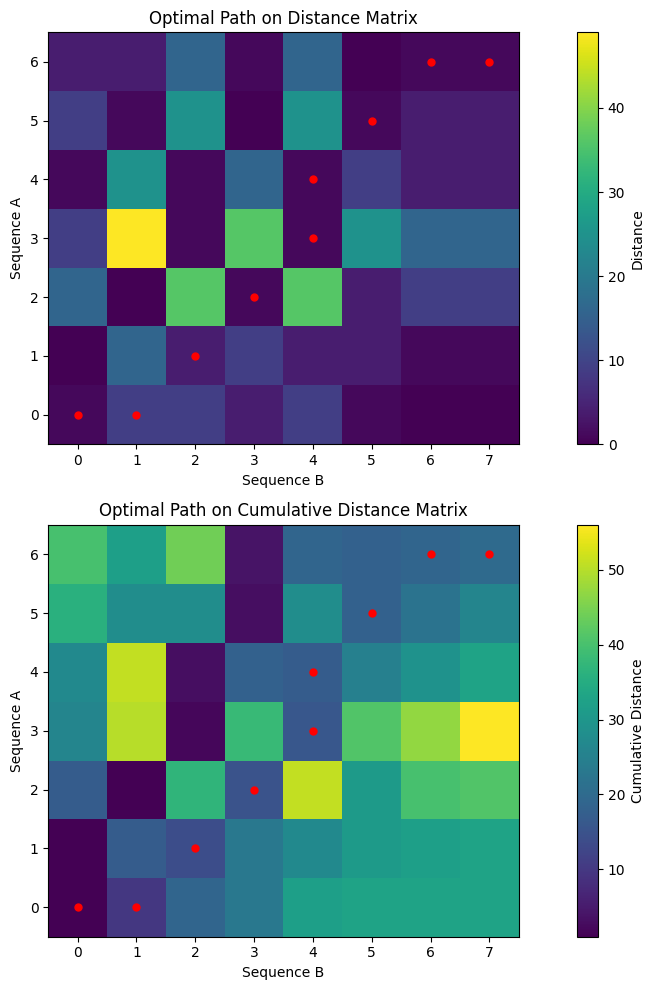



Optimal Distance(Cost) =  20.0 
Normalized Cost =  1.3333333333333333


In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

###########################################################
#Function to obtain the optimal distance and path between two sequences
###########################################################
def DTW(sequence1,sequence2):
    #######################################################
    # Input  : Two sequences
    # Output : DTW path and optimal distance
    #######################################################

    distance_matrix = np.zeros((len(sequence1), len(sequence2)))
    for i in range(len(sequence1)):
        for j in range(len(sequence2)):
            distance_matrix[i][j] = abs(sequence1[i] - sequence2[j])**2


    #######################################################
    # Code snippet to create the cumulative distance matrix
    #######################################################
    # Initialize the cumulative distance matrix
    DTW_cumulate_Matrix = np.zeros((len(sequence1) + 1, len(sequence2) + 1))   #Cummulative distance matrix
    for i in range(1, len(sequence1)+1):
      DTW_cumulate_Matrix[i, 0] = np.inf
    for j in range(1, len(sequence2)+1):
      DTW_cumulate_Matrix[0, j] = np.inf
    #Iterate through the sequence of points in sequences and compute the distance between the sequences.
    for i in range(1, len(sequence1) + 1, 1): #you can start from 1
        for j in range(1, len(sequence2) + 1, 1):
            current_distance = distance_matrix[i-1][j-1]  #Compute the distance between the two points


            #Add min(DTW_cumulate_Matrix[i-1,j],DTW_cumulate_Matrix[i-1,j-1],DTW_cumulate_Matrix[i,j-1]) to "current_distance" and assign it to "DTW_cumulate_Matrix[i,j]"

            DTW_cumulate_Matrix[i][j] = current_distance + min(DTW_cumulate_Matrix[i-1][j],
                                                               DTW_cumulate_Matrix[i-1][j-1],
                                                               DTW_cumulate_Matrix[i][j-1])


    similarity_measure = DTW_cumulate_Matrix[-1][-1]   ## optimal distance = similarity measure = index of similarity

    #######################################################
    # Code snippet to find the optimal DTW path and the corresponding optimal distance
    #######################################################
    opt_distance = 0.0
    i = len(sequence1) # length of the sequence1
    j = len(sequence2) # length of the sequence2
    path = [(i, j)]

    while i!=0 and j!=0: #Start from the last point and backtrack
        #Get the indexes (i,j) of the small value among (DTW_cumulate_Matrix[i-1,j], DTW_cumulate_Matrix[i-1,j-1], DTW_cumulate_Matrix[i,j-1])
        min_idx = np.argmin([DTW_cumulate_Matrix[i-1][j], DTW_cumulate_Matrix[i-1][j-1], DTW_cumulate_Matrix[i][j-1]])
        if min_idx == 0:
            i -= 1
        elif min_idx == 1:
            i -= 1
            j -= 1
        else:
            j -= 1
        # Add the current indexes distance
        opt_distance = opt_distance + distance_matrix[i-1][j-1]   #Compute the distance between the points sequence1[i] and sequence2[j]


        #Store the required indexes to obtain the optimal path
        path.append((i, j))


    path.append((0, 0))

    print('Distance Matrix is:\n', np.flipud(distance_matrix))
    print('Cumulative Matrix is:\n', np.flipud(DTW_cumulate_Matrix[1:, 1:]))

    #######################################################
    # Return optimal distance and optimal dtw path
    #######################################################

    return opt_distance, similarity_measure, list(reversed(path))


def plotDTWpath(sequence1,sequence2):
    #######################################################
    # Inputs : sequence1 and sequence2
    # Outputs : plot of optimal path on distance matrix and cumulative distance matrix
    #######################################################

    #Compute distance and cumulative distance between the given templates
    DM = np.zeros((len(sequence1), len(sequence2)))
    for i in range(len(sequence1)):
        for j in range(len(sequence2)):
            DM[i][j] = abs(sequence1[i] - sequence2[j])**2

    CM = np.zeros((len(sequence1) + 1, len(sequence2) + 1))
    for i in range(1, len(sequence1)+1):
      CM[i, 0] = np.inf
    for j in range(1, len(sequence2)+1):
      CM[0, j] = np.inf

    for i in range(1, len(sequence1) + 1):
        for j in range(1, len(sequence2) + 1):
            current_distance = abs(sequence1[i - 1] - sequence2[j - 1])**2
            CM[i][j] = current_distance + min(CM[i - 1][j], CM[i - 1][j - 1], CM[i][j - 1])

    #Obtain the optimal path using "DTW" function
    opt_dist, _, path = DTW(sequence1, sequence2)
    # print(np.flipud(CM[1:, 1:]))

    #Plot the optimal path on distance and cumulative matrices and verify the DTW codes
    fig, axs = plt.subplots(2, 1, figsize=(12, 10))

    im1 = axs[0].imshow(DM, origin='lower', cmap='viridis', interpolation='nearest')
    axs[0].set_title('Optimal Path on Distance Matrix')
    axs[0].set_xlabel('Sequence B')
    axs[0].set_ylabel('Sequence A')
    plt.colorbar(im1, ax=axs[0], label='Distance')

    im2 = axs[1].imshow(CM[1:, 1:], origin='lower', cmap='viridis', interpolation='nearest')
    axs[1].set_title('Optimal Path on Cumulative Distance Matrix')
    axs[1].set_xlabel('Sequence B')
    axs[1].set_ylabel('Sequence A')
    plt.colorbar(im2, ax=axs[1], label='Cumulative Distance')

    for point in path[2:]:
        axs[0].plot(point[1]-1, point[0]-1, 'ro', markersize=5)
        axs[1].plot(point[1]-1, point[0]-1, 'ro', markersize=5)

    plt.tight_layout()
    plt.show()

    print('\n\nOptimal Distance(Cost) = ', opt_dist, '\nNormalized Cost = ', opt_dist/(len(sequence1) + len(sequence2)))

A = [4, 3, 7, 0, 2, 6, 5]
B = [3, 7, 1, 6, 1, 5, 4, 4]

plotDTWpath(A, B)


<b> Report your observations </b>

1.

2.

3.




<dt> <h4> <b> Part (b): </b> In this part of the assignment, we expect you to build the Isolated digit recognition system with the help of the above written DTW algorithm. </dt> </h4>

![picture](https://drive.google.com/uc?export=view&id=1nGtWwbDg8PJBNwck_dUt2mmsCBshrGYc)



<dt> <h4> 1. Record one repetition each of the digits zero, one, two, three, four, five, six, seven, eight, and nine. The modules to record the voice in online mode are provided here. If you are not comfortable using the online recording modules, you can record the digits offline and access them in google colab through proper codes. </dt> </h4>
<dt> <h4> 2. Record three further repetitions of the same digits (Isolated words) as test data. </dt> </h4>  
<dt> <h4> 3. The codes to compute the signal's templates (Mel Frequency Cepstral Coefficients) are provided. Please use them to obtain the templates of the speech signals. </dt> </h4>  
<dt> <h4> 4. Write an algorithm to perform isolated digit recognition with the help of the DTW codes. </dt> </h4>
<dt> <h4> 5. Take two pairs such that one pair is the repetition of the same digit and another one is two different digits. Plot the optimal DTW path on distance and cumulative distance matrices for both cases.   </dt> </h4>
<dt> <h4> 6. Evaluate the digit recognition accuracy, i.e., the percentage of correctly recognized trials out of each digit's total number of attempts. </dt> </h4>
<dt> <h4> 7. Create a confusion matrix and report the most confusing digits. </dt> </h4>


**Module to record the voice in online mode**

In [ ]:
# @title Default title text
from IPython.display import Javascript
from google.colab import output
from base64 import b64decode
from io import BytesIO
!pip -q install pydub
from pydub import AudioSegment

RECORD = """
const sleep  = time => new Promise(resolve => setTimeout(resolve, time))
const b2text = blob => new Promise(resolve => {
  const reader = new FileReader()
  reader.onloadend = e => resolve(e.srcElement.result)
  reader.readAsDataURL(blob)
})
var record = time => new Promise(async resolve => {
  stream = await navigator.mediaDevices.getUserMedia({ audio: true })
  recorder = new MediaRecorder(stream)
  chunks = []
  recorder.ondataavailable = e => chunks.push(e.data)
  recorder.start()
  await sleep(time)
  recorder.onstop = async ()=>{
    blob = new Blob(chunks)
    text = await b2text(blob)
    resolve(text)
  }
  recorder.stop()
})
"""

def record(sec=3):
  display(Javascript(RECORD))
  s = output.eval_js('record(%d)' % (sec*1000))
  b = b64decode(s.split(',')[1])
  audio = AudioSegment.from_file(BytesIO(b))
  return audio

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import scipy.io.wavfile
import io
import os
from IPython.display import Audio
from google.colab import files

#### Please comment below line, if you already uploaded the 'recording.wav' in '/content/'
# !rm recording_0.wav
# !rm recording_1.wav
# !rm recording_2.wav
# !rm recording_3.wav
# !rm recording_4.wav
# !rm recording_5.wav
# !rm recording_6.wav
# !rm recording_7.wav
# !rm recording_8.wav
# !rm recording_9.wav


#### You can run this module in the loop to record more repetitions of the digits.
for i in range(10):
  if os.path.isfile(f'recording_{i}.wav'):
      print("wavefile exists, later part of the code uses 'recording.wav' as input speech")
  else:
      print("Recording the digits")
      wav = record(3.0) #It will record three seconds of your speech. You can change the duration.
      wav = wav.set_frame_rate(16000)
      sig=wav.get_array_of_samples()
      samples=np.array(sig).T.astype(np.float32)
      fp_arr = np.array(samples).T.astype(np.float32)
      fp_arr /= np.iinfo(sig.typecode).max
      scipy.io.wavfile.write(f'recording_{i}.wav', 16000, fp_arr) #Please change the name.

      # files.download(f'recording_{i}.wav')

  wn = Audio('recording_'+ str(i)+ '.wav', autoplay=False)
  display(wn)

Recording the digits


<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

Recording the digits


<IPython.core.display.Javascript object>

In [ ]:
instance = ['a', 'b', 'c']
# print(f'recording_{i}_{instance[0]}.wav')
# !rm recording_0_a.wav
# !rm recording_1_a.wav
# !rm recording_2_a.wav
# !rm recording_3_a.wav
# !rm recording_4_a.wav
# !rm recording_5_a.wav
# !rm recording_6_a.wav
# !rm recording_7_a.wav
# !rm recording_8_a.wav
# !rm recording_9_a.wav

# !rm recording_0_b.wav
# !rm recording_1_b.wav
# !rm recording_2_b.wav
# !rm recording_3_b.wav
# !rm recording_4_b.wav
# !rm recording_5_b.wav
# !rm recording_6_b.wav
# !rm recording_7_b.wav
# !rm recording_8_b.wav
# !rm recording_9_b.wav

# !rm recording_0_c.wav
# !rm recording_1_c.wav
# !rm recording_2_c.wav
# !rm recording_3_c.wav
# !rm recording_4_c.wav
# !rm recording_5_c.wav
# !rm recording_6_c.wav
# !rm recording_7_c.wav
# !rm recording_8_c.wav
# !rm recording_9_c.wav

for i in range(10):
  for j in range(3):
    if os.path.isfile(f'recording_{i}_{instance[j]}.wav'):
        print("wavefile exists, later part of the code uses 'recording.wav' as input speech")
    else:
        print(f"Recording the digit {i} for testing...")
        wav = record(3.0) #It will record three seconds of your speech. You can change the duration.
        wav = wav.set_frame_rate(16000)
        sig=wav.get_array_of_samples()
        samples=np.array(sig).T.astype(np.float32)
        fp_arr = np.array(samples).T.astype(np.float32)
        fp_arr /= np.iinfo(sig.typecode).max
        scipy.io.wavfile.write(f'recording_{i}_{instance[j]}.wav', 16000, fp_arr) #Please change the name.

        # files.download(f'recording_{i}_{instance[j]}.wav')

    wn = Audio(f'recording_{i}_{instance[j]}.wav', autoplay=False)
    display(wn)

Recording the digit 0 for testing...


<IPython.core.display.Javascript object>

Recording the digit 0 for testing...


<IPython.core.display.Javascript object>

Recording the digit 0 for testing...


<IPython.core.display.Javascript object>

Recording the digit 1 for testing...


<IPython.core.display.Javascript object>

Recording the digit 1 for testing...


<IPython.core.display.Javascript object>

Recording the digit 1 for testing...


<IPython.core.display.Javascript object>

Recording the digit 2 for testing...


<IPython.core.display.Javascript object>

Recording the digit 2 for testing...


<IPython.core.display.Javascript object>

Recording the digit 2 for testing...


<IPython.core.display.Javascript object>

Recording the digit 3 for testing...


<IPython.core.display.Javascript object>

Recording the digit 3 for testing...


<IPython.core.display.Javascript object>

Recording the digit 3 for testing...


<IPython.core.display.Javascript object>

Recording the digit 4 for testing...


<IPython.core.display.Javascript object>

Recording the digit 4 for testing...


<IPython.core.display.Javascript object>

Recording the digit 4 for testing...


<IPython.core.display.Javascript object>

Recording the digit 5 for testing...


<IPython.core.display.Javascript object>

Recording the digit 5 for testing...


<IPython.core.display.Javascript object>

Recording the digit 5 for testing...


<IPython.core.display.Javascript object>

Recording the digit 6 for testing...


<IPython.core.display.Javascript object>

Recording the digit 6 for testing...


<IPython.core.display.Javascript object>

Recording the digit 6 for testing...


<IPython.core.display.Javascript object>

Recording the digit 7 for testing...


<IPython.core.display.Javascript object>

Recording the digit 7 for testing...


<IPython.core.display.Javascript object>

Recording the digit 7 for testing...


<IPython.core.display.Javascript object>

Recording the digit 8 for testing...


<IPython.core.display.Javascript object>

Recording the digit 8 for testing...


<IPython.core.display.Javascript object>

Recording the digit 8 for testing...


<IPython.core.display.Javascript object>

Recording the digit 9 for testing...


<IPython.core.display.Javascript object>

Recording the digit 9 for testing...


<IPython.core.display.Javascript object>

Recording the digit 9 for testing...


<IPython.core.display.Javascript object>

In [ ]:
for i in range(10):
  for j in range(3):
    files.download(f'recording_{i}_{instance[j]}.wav')

for i in range(10):
  files.download(f'recording_{i}.wav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**Algorithm to perform isolated digit recognition**

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections
import scipy.io.wavfile as wav
!pip -q install python_speech_features
!pip -q install speechpy
from python_speech_features import mfcc
import speechpy



###########################################################
#Function to obtain the optimal distance and path between two templates
###########################################################
def vectorDTW(template1, template2):
    # Calculate the dimensions of sequence1 and sequence2
    rows1, cols1 = template1.shape
    rows2, cols2 = template2.shape

    # Initialize the cumulative distance matrix
    DTW_cumulate_Matrix = np.zeros((rows1+1, rows2+1))

    # Initialize the matrix for storing the cumulative distances
    for i in range(rows1):
        DTW_cumulate_Matrix[i, 0] = np.inf
    for j in range(rows2):
        DTW_cumulate_Matrix[0, j] = np.inf
    DTW_cumulate_Matrix[0, 0] = 0

    # Initialize the matrix for storing the optimal path
    path = np.zeros((rows1+1, rows2+1, 2), dtype=int)

    # Iterate through each row of sequence1 and calculate the distance with each row of sequence2
    for i in range(1, rows1+1):
        for j in range(1, rows2+1):
            distance = np.sum((template1[i-1] - template2[j-1])**2)

            DTW_cumulate_Matrix[i, j] = distance + min(DTW_cumulate_Matrix[i - 1, j],
                                                       DTW_cumulate_Matrix[i - 1, j - 1],
                                                       DTW_cumulate_Matrix[i, j - 1])

            min_index = np.argmin([DTW_cumulate_Matrix[i - 1, j],
                                   DTW_cumulate_Matrix[i - 1, j - 1],
                                   DTW_cumulate_Matrix[i, j - 1]])
            if min_index == 0:
                path[i, j] = [i - 1, j]
            elif min_index == 1:
                path[i, j] = [i - 1, j - 1]
            else:
                path[i, j] = [i, j - 1]

    opt_distance = DTW_cumulate_Matrix[-1, -1]

    i, j = rows1, rows2
    optimal_path = [(i, j)]
    while i > 0 or j > 0:
        i, j = path[i, j]
        optimal_path.append((i, j))

    path1 = list(path)
    path1.append([(0, 0)])
    path1 = np.array(path)
    optimal_path.reverse()

    # print(opt_distance)
    return opt_distance, optimal_path, DTW_cumulate_Matrix


def plotDTWpath1(template1,template2):      ## changed the name of the function by adding suffix 1 to distinguish from the function of question 1
    #######################################################
    # Inputs : template1 and template2
    # Outputs : plot of optimal path on distance matrix and cumulative distance matrix
    #######################################################

    # (rate1,sig1) = wav.read(template1)
    # sig1=sig1-np.mean(sig1)
    # mfcc_feat1=mfcc(sig1,rate1,numcep=13,winlen=0.025,winstep=0.01,nfilt=40,lowfreq=20,highfreq=4000,winfunc=np.hamming)
    # mfcc_feat_cmvn1=speechpy.processing.cmvnw(mfcc_feat1,win_size=301,variance_normalization=False)
    seqA = template1

    # (rate2,sig2) = wav.read(template2)
    # sig2=sig2-np.mean(sig2)
    # mfcc_feat2=mfcc(sig2,rate2,numcep=13,winlen=0.025,winstep=0.01,nfilt=40,lowfreq=20,highfreq=4000,winfunc=np.hamming)
    # mfcc_feat_cmvn2=speechpy.processing.cmvnw(mfcc_feat2,win_size=301,variance_normalization=False)
    seqB = template2

    rows1, cols1 = seqA.shape
    rows2, cols2 = seqB.shape

    #Compute distance and cumulative distance between the given templates
    DM = np.zeros((rows1, rows2))
    for i in range(rows1):
        for j in range(rows2):
            DM[i][j] = np.sum((seqA[i] - seqB[j])**2)

    CM = np.zeros((rows1 + 1, rows2 + 1))
    for i in range(1, rows1+1):
      CM[i, 0] = np.inf
    for j in range(1, rows2+1):
      CM[0, j] = np.inf

    for i in range(1, rows1 + 1):
        for j in range(1, rows2 + 1):
            current_distance = DM[i-1][j-1]
            CM[i][j] = current_distance + min(CM[i - 1][j], CM[i - 1][j - 1], CM[i][j - 1])


    #Obtain the optimal path using "DTW" function
    opt_dist, path, _ = vectorDTW(template1, template2)


    #Plot the optimal path on distance and cumulative matrices and verify the DTW codes
    fig, axs = plt.subplots(2, 1, figsize=(12, 10))

    im1 = axs[0].imshow(DM, origin='lower', cmap='viridis', interpolation='nearest')
    axs[0].set_title('Optimal Path on Distance Matrix')
    axs[0].set_xlabel('Template 2')
    axs[0].set_ylabel('Template 1')
    plt.colorbar(im1, ax=axs[0], label='Distance')

    im2 = axs[1].imshow(CM[1:, 1:], origin='lower', cmap='viridis', interpolation='nearest')
    axs[1].set_title('Optimal Path on Cumulative Distance Matrix')
    axs[1].set_xlabel('Template 2')
    axs[1].set_ylabel('Template 1')
    plt.colorbar(im2, ax=axs[1], label='Cumulative Distance')

    for point in path[2:]:
        axs[0].plot(point[1]-1, point[0]-1, 'ko', markersize=5)
        axs[1].plot(point[1]-1, point[0]-1, 'ko', markersize=5)

    plt.tight_layout()
    plt.show()

    print('\n\nOptimal Distance(Cost) = ', opt_dist, '\nNormalized Cost = ', opt_dist/(len(seqA) + len(seqB)))



**Plot the optimal DTW path**

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

instance = ['a', 'b', 'c']

tr_data = []
for i in range(10):
    wavfile = f'recording_{i}.wav'
    (rate, sig) = wav.read(wavfile)
    sig = sig - np.mean(sig)
    mfcc_feat = mfcc(sig, rate, numcep=13, winlen=0.025, winstep=0.01, nfilt=40, lowfreq=20, highfreq=4000, winfunc=np.hamming)
    mfcc_feat_cmvn = speechpy.processing.cmvnw(mfcc_feat, win_size=301, variance_normalization=False)
    tr_data.append(mfcc_feat_cmvn)

test_data_mfcc = []
for i in range(10):
    for j in range(3):
        wavfile = f'recording_{i}_{instance[j]}.wav'
        (rate, sig) = wav.read(wavfile)
        sig = sig - np.mean(sig)
        mfcc_feat = mfcc(sig, rate, numcep=13, winlen=0.025, winstep=0.01, nfilt=40, lowfreq=20, highfreq=4000, winfunc=np.hamming)
        mfcc_feat_cmvn = speechpy.processing.cmvnw(mfcc_feat, win_size=301, variance_normalization=False)
        test_data_mfcc.append(mfcc_feat_cmvn)

tr_targets = [s for s in range(10)]
test_targets = [[x, x, x] for x in range(10)]
test_targets = list(np.array(test_targets).reshape(30, ))
test_pred = np.zeros(30)
for i in range(10):
    for k in range(3):
        pred = -1
        cost = np.inf
        for j in range(10):
            op_dist, _, _ = vectorDTW(tr_data[j], test_data_mfcc[i*3 + k])
            if op_dist < cost:
                cost = op_dist
                pred = j
        test_pred[i*3+k] = pred


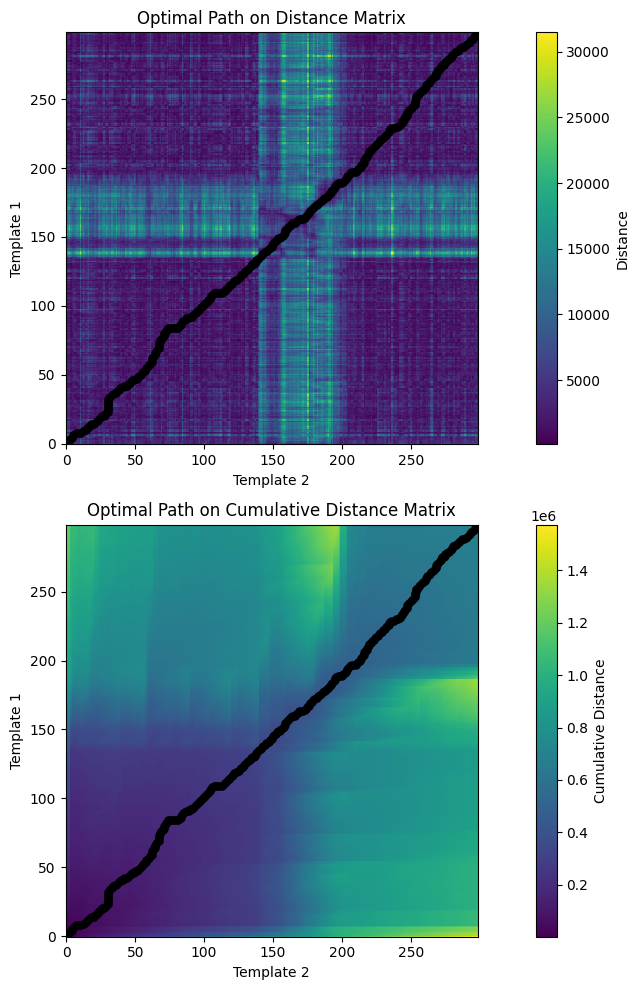



Optimal Distance(Cost) =  691460.841796875 
Normalized Cost =  1156.2890331051422


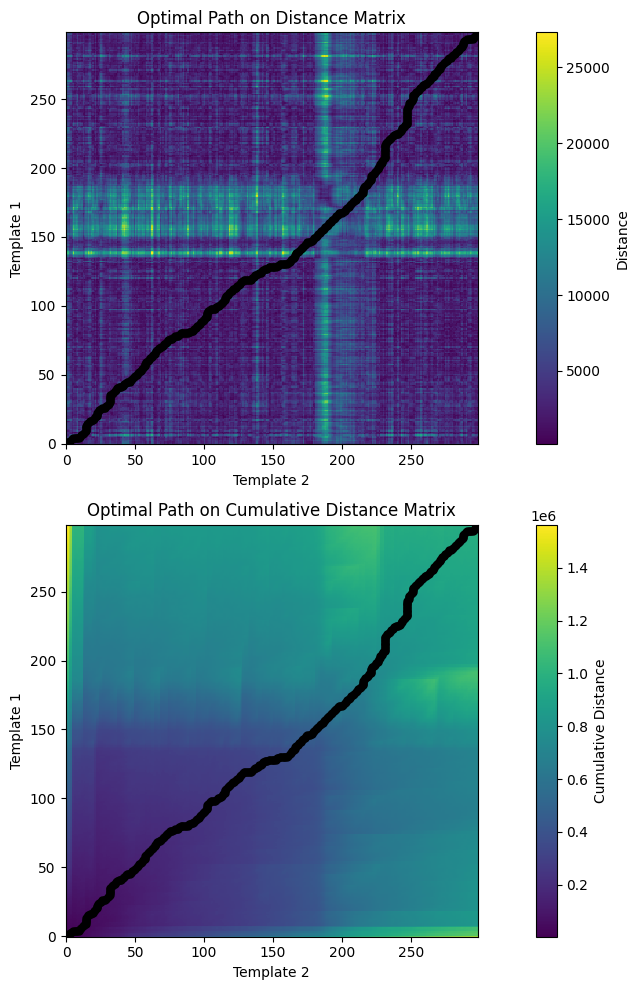



Optimal Distance(Cost) =  984940.3375549316 
Normalized Cost =  1647.0574206604208


In [ ]:
#  for i in range(30):
    # print((tr_data[int(test_pred[i])], test_data[i]))
    # print(test_pred[i], i)
    # print(tr_data[int(test_pred[i])])
plotDTWpath1(tr_data[0], test_data_mfcc[0])
plotDTWpath1(tr_data[0], test_data_mfcc[5])


**Compute the required metrics ( digit recognition accuracy ) and illustrations ( confusion matrix )**

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

def Accuracy(y_test, y_pred):

    accuracy = np.count_nonzero((y_test - y_pred)==0)/y_pred.shape[0]
    return accuracy

def compute_confusion_matrix(true, pred):

    confusion_matrix = np.zeros((10, 10), dtype=int)
    for i in range(len(true)):
        confusion_matrix[int(true[i])][int(pred[i])] += 1

    return confusion_matrix

Accuracy = Accuracy(test_targets, test_pred)
confusion_matrix = compute_confusion_matrix(test_targets, test_pred)

print(f'The Digit Recongnition Accuracy is: {Accuracy*100}%\n')
print(f'The confusion matrix is:\n{confusion_matrix}')

The Digit Recongnition Accuracy is: 80.0%

The confusion matrix is:
[[3 0 0 0 0 0 0 0 0 0]
 [0 3 0 0 0 0 0 0 0 0]
 [0 0 2 0 0 0 0 1 0 0]
 [0 0 0 2 0 0 1 0 0 0]
 [0 0 0 0 3 0 0 0 0 0]
 [0 0 0 0 0 3 0 0 0 0]
 [0 0 0 0 0 0 3 0 0 0]
 [0 0 1 0 0 0 0 2 0 0]
 [0 0 0 0 0 0 2 0 1 0]
 [0 0 0 0 0 0 0 1 0 2]]


<b> Report your observations </b>

1. By identifying the relationship between points in one sequence and points in the other, the DTW algorithm finds the best alignment path between two sequences.

2. The optimal path is found to be same in the cumulative matrix and the distance matrix.

3. Even though the training and testing data were noisy due to background noise and microphone quality, the Vector DTW algorithm produced an accuracy of 80%, which is neither too high nor too low. This means that the algorithm's performance was adequate to create an accuracy of 80% and not lower. In order to accommodate for variability, I also recorded the test digits using slightly different pronunciations for practically all of the digits.

4. According to the confusing matrix (checking the value of diagonal elements), the most confusing digits are 8, 7, 9, 2, 3 as the Diagonal entries at those indices are lower.

    Example of confusions as shown by the confusion matrix:
    - Digit 7 (confused with digits 3, 4, and 8)
    - Digit 8 (confused with digits 7 and 9)
    - Digit 9 (confused with digit 8)


<dt> <h4> <b> Part (c): </b> In this part of the assignment, we expect you to evaluate the above-written digit recognition system performance on different test cases and understand the pros and cons of the DTW algorithm.  </dt> </h4>

[link to TDIGITS data](https://drive.google.com/drive/folders/1oV3jrUiug0-SwWLOdLtbXA6hzqYYIlI7?usp=sharing)


<dt> <h4> 1. Evaluate the performance of digit recognition systems on the TDGIT database shared with you and report the accuracy. </dt> </h4>
<dt> <h4> 2. Evaluate the performance in different cases, i.e., a pair of templates with the same speaker and a different speaker. </dt> </h4>
<dt> <h4> 3. Please report some of the changes to improve the system performance. </dt> </h4>

In [ ]:
import os
import numpy as np
import scipy.io.wavfile as wav
import scipy.io.wavfile as wav
!pip -q install python_speech_features
!pip -q install speechpy
from python_speech_features import mfcc
import speechpy

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define path to the directory containing the data
data_dir = '/content/drive/My Drive/MultiSpeakerDigitData_modified'

# Function to convert WAV file to MFCC features
def convert_into_mfcc(wavfile):
    (rate, sig) = wav.read(wavfile)
    sig = sig - np.mean(sig)
    mfcc_feat = mfcc(sig, rate, numcep=13, winlen=0.025, winstep=0.01, nfilt=40, lowfreq=20, highfreq=4000, winfunc=np.hamming)
    mfcc_feat_cmvn = speechpy.processing.cmvnw(mfcc_feat, win_size=301, variance_normalization=False)
    return mfcc_feat_cmvn


training_data = {'jackson': [], 'nicolas': [], 'theo': [], 'yweweler': []}
training_targ = {'jackson': [], 'nicolas': [], 'theo': [], 'yweweler': []}
testing_data = {'jackson': [], 'nicolas': [], 'theo': [], 'yweweler': []}
testing_targ = {'jackson': [], 'nicolas': [], 'theo': [], 'yweweler': []}


for person_folder in os.listdir(data_dir):
    person_dir = os.path.join(data_dir, person_folder)
    for wavfile in os.listdir(person_dir):
        # Extract digit and person's name from the file name
        components = wavfile.split('_')
        digit = int(components[0])
        person = components[1]
        mfcc_features = convert_into_mfcc(os.path.join(person_dir, wavfile))

        if int(components[2].split('.')[0]) == 0:
            training_data[person].append(mfcc_features)
            training_targ[person].append(digit)
        else:
            testing_data[person].append(mfcc_features)
            testing_targ[person].append(digit)

def calculate_accuracy(y_true, y_pred):
    return np.mean(y_true == y_pred)

# Task 1: Performance evaluation with pairs of templates from the same speaker

accuracies_same_speaker = {}

for person in training_data.keys():
    y_pred = np.zeros(len(testing_data[person]))

    for i, test_sample in enumerate(testing_data[person]):
        min_distance = np.inf
        predicted_label = None

        for j,train_sample in enumerate(training_data[person]):
            distance, _, _ = vectorDTW(train_sample, test_sample)
            if distance < min_distance:
                min_distance = distance
                predicted_label = training_targ[person][j]

        y_pred[i] = predicted_label

    # Accuracy for the current person
    accuracy = calculate_accuracy(testing_targ[person], y_pred)
    accuracies_same_speaker[person] = accuracy

print("Accuracies with templates from the same speaker:")
for person, accuracy in accuracies_same_speaker.items():
    print(f"{person.capitalize()}: {accuracy * 100:.2f}%")

# Task 2: Performance evaluation with pairs of templates(reference and test signals) from different speakers

accuracies_diff_speaker = {}

for speaker_ref, speaker_test in [('nicolas', 'theo'), ('nicolas', 'jackson'), ('nicolas', 'yweweler'),
                                  ('jackson', 'theo'), ('jackson', 'yweweler'), ('theo', 'yweweler')]:
    y_true = np.zeros(len(testing_data[speaker_test]))
    y_pred = np.zeros(len(testing_data[speaker_test]))

    for i, test_sample in enumerate(testing_data[speaker_test]):
        min_distance = np.inf
        predicted_label = None

        for j, train_sample in enumerate(training_data[speaker_ref]):
            distance, _, _ = vectorDTW(train_sample, test_sample)
            if distance < min_distance:
                min_distance = distance
                predicted_label = training_targ[speaker_ref][j]

        y_pred[i] = predicted_label

    # Aaccuracy for the current speaker pair
    accuracy = calculate_accuracy(testing_targ[speaker_test], y_pred)
    accuracies_diff_speaker[(speaker_ref, speaker_test)] = accuracy

print("\nAccuracies with reference and test signals from different speakers:")
for speaker_pair, accuracy in accuracies_diff_speaker.items():
    print(f"(Reference speaker){speaker_pair[0].capitalize()} -  (Testing speaker){speaker_pair[1].capitalize()}: {accuracy * 100:.2f}%")


# Suggest some of the changes to improve the system performance.
### Please find the suggestions written below in the markdown cell


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Accuracies with templates from the same speaker:
Jackson: 81.22%
Nicolas: 79.59%
Theo: 88.57%
Yweweler: 76.33%

Accuracies with reference and test signals from different speakers:
(Reference speaker)Nicolas -  (Testing speaker)Theo: 42.45%
(Reference speaker)Nicolas -  (Testing speaker)Jackson: 33.27%
(Reference speaker)Nicolas -  (Testing speaker)Yweweler: 39.59%
(Reference speaker)Jackson -  (Testing speaker)Theo: 43.27%
(Reference speaker)Jackson -  (Testing speaker)Yweweler: 29.80%
(Reference speaker)Theo -  (Testing speaker)Yweweler: 41.84%


### **Suggest some of the changes to improve the system performance.**

1. **Improvement of the Model:**
Performance can be enhanced by adjusting the DTW algorithm's hyperparameters, such as the distance metric (Euclidean, Cosine) and windowing strategies.

2. **Data Augmentation:** - Incorporate variations into the training data by applying noise, time stretching, pitch shifting, etc. By doing this, the model may become better in incorporating and account for changes in voice signals and have better accuracy.

3. **Speaker Normalization:**
By using speaker normalization strategies to lessen the unpredictability that comes from using diverse speakers. This might involve applying techniques to the feature vectors such as z-score normalization or cepstral mean normalization (CMN).

<b> Report your observations </b>

1. When the reference and test signals come from the same speaker, , the accuracy of the recognition system is greatly increased as compared to when they come from different speakers. It is observed that the system is better at identifying speech patterns and characteristics unique to individual speakers than it is at handling variations brought about by multiple speakers. This could be because a wave signal from the same speaker will always have the same waveform (frequency, loudness, and quality).
- In general, speech patterns and acoustic characteristics vary less for the same speaker. Higher digit identification accuracy is the outcome of the alignment process being made simpler by this lower unpredictability caused due to less variability of speech patterns.

2. Across different speakers, the variability in speech patterns and the voice is higher, apart from variations in background noise, recording conditions, and microphone attributes. This variability can negatively impact recognition accuracy by introducing additional sources of distortion and mismatch.

3. The accuracy of digit identification goes down in case of different speakers as when generalizing to test signals from different speakers, recognition models that were trained on data from a single speaker may face difficulties. During training, these models might not have been exposed to the variety of voice traits and speech patterns of many speakers, which resulted in poor digit identification accuracy.

